# DCIT407 Semester Project — Group 16
## Morphological-Based Object Counting in Binary Images

**Group Leader:*** *Aggrey Paintsil Ishmeal* 
### **Group Members (8):** 

#### 1.**Aggrey Paintsil Ishmeal** - **11125864**
#### 2. **Addo Naa Shidaa Adjorkor** - **11307343**
#### 3.**Kelvin Kwaku Siaw Ashong** - **11296303**
#### 4.**Joshua Andoh-Mensah** - **11024515**
#### 5. **Raphael Quaye** - **11253474**
#### 6. **Benson Steve Fafa Kofi** - **11357947**
#### 7. **Nana Ampomah Arhin** - **11019735**
#### 8. **Abigail Akua Ninsin** - **11125864**

### Goal
To count objects in images using morphological image processing and segmentation methods.


In [1]:
import os
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Make plots bigger and consistent
plt.rcParams["figure.figsize"] = (12, 6)
plt.rcParams["image.cmap"] = "gray"


In [2]:
def show_images(images, titles=None, cols=3, suptitle=None):
    """
    Display images in a grid.
    images: list of numpy arrays
    titles: list of strings (same length as images)
    cols: number of columns in the grid
    """
    if titles is None:
        titles = [""] * len(images)

    rows = int(np.ceil(len(images) / cols))
    plt.figure(figsize=(5 * cols, 4 * rows))

    if suptitle:
        plt.suptitle(suptitle, fontsize=16)

    for i, (img, title) in enumerate(zip(images, titles), start=1):
        plt.subplot(rows, cols, i)

        # If image is BGR (OpenCV default), convert to RGB for correct display
        if img.ndim == 3:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img_rgb)
        else:
            plt.imshow(img)

        plt.title(title)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


def load_images_from_folder(folder_path, exts=(".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff")):
    """
    Load all images from a folder. Returns a list of (filename, image_bgr).
    """
    folder = Path(folder_path)
    if not folder.exists():
        raise FileNotFoundError(f"Folder not found: {folder.resolve()}")

    image_files = [p for p in folder.iterdir() if p.suffix.lower() in exts]
    image_files.sort()

    data = []
    for p in image_files:
        img = cv2.imread(str(p))  # BGR
        if img is None:
            print(f"Warning: failed to read {p.name}")
            continue
        data.append((p.name, img))

    if len(data) == 0:
        raise ValueError(f"No readable images found in: {folder.resolve()}")

    return data


Loaded 10 images.


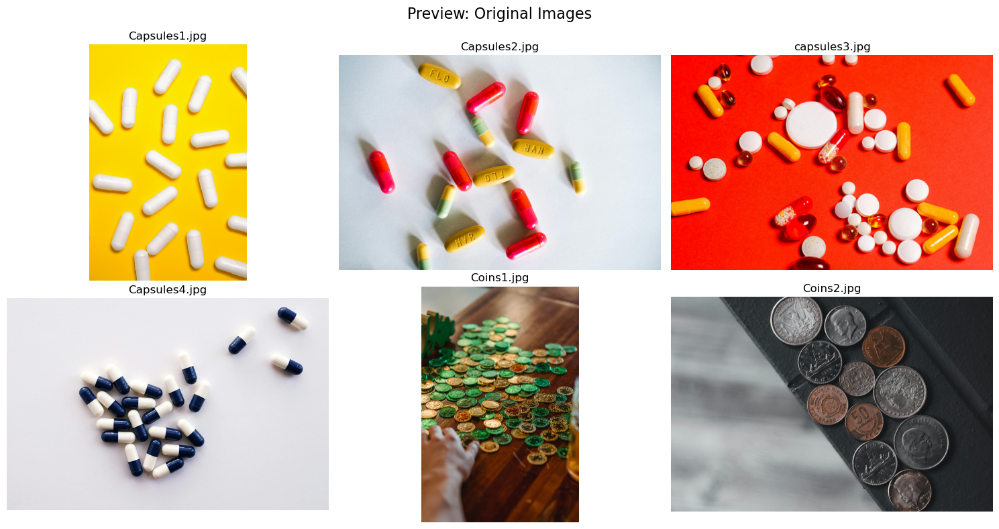

In [3]:
IMAGES_DIR = "Images"   # must match your folder name exactly

image_data = load_images_from_folder(IMAGES_DIR)
print(f"Loaded {len(image_data)} images.")

# Preview first 6
preview_imgs = [img for _, img in image_data[:6]]
preview_titles = [name for name, _ in image_data[:6]]
show_images(preview_imgs, preview_titles, cols=3, suptitle="Preview: Original Images")


In [4]:
def to_binary(img_bgr, blur_ksize=5, use_otsu=True, manual_thresh=127, invert=False):
    """
    Convert BGR image to binary (0/255).
    Steps: grayscale -> blur -> threshold (Otsu or manual).
    invert=True makes objects white if they are dark on light background.
    """
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (blur_ksize, blur_ksize), 0)

    if use_otsu:
        # Otsu automatically chooses threshold value
        thresh_type = cv2.THRESH_BINARY_INV if invert else cv2.THRESH_BINARY
        _, binary = cv2.threshold(blurred, 0, 255, thresh_type + cv2.THRESH_OTSU)
    else:
        thresh_type = cv2.THRESH_BINARY_INV if invert else cv2.THRESH_BINARY
        _, binary = cv2.threshold(blurred, manual_thresh, 255, thresh_type)

    return gray, binary


In [5]:
def morphological_cleanup(binary, ksize=3, open_iters=1, close_iters=1):
    """
    Clean a binary image using morphology.
    - Opening removes small noise
    - Closing fills small holes
    """
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))

    opened = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=open_iters)
    cleaned = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel, iterations=close_iters)

    return opened, cleaned


In [6]:
def count_connected_components(cleaned_binary, min_area=50):
    """
    Count objects by connected components and filter small noise by area.
    Assumes foreground objects are white (255).
    """
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(cleaned_binary, connectivity=8)

    # Label 0 is background
    object_count = 0
    kept_mask = np.zeros_like(cleaned_binary)

    for label in range(1, num_labels):
        area = stats[label, cv2.CC_STAT_AREA]
        if area >= min_area:
            object_count += 1
            kept_mask[labels == label] = 255

    return object_count, kept_mask, labels, stats, centroids


In [7]:
def count_watershed(img_bgr, cleaned_binary, sure_fg_thresh_ratio=0.5, min_area=50):
    """
    Separate touching objects using watershed segmentation.
    Returns: count, markers_visual, boundary_overlay
    """
    # Sure background: dilate the cleaned binary
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    sure_bg = cv2.dilate(cleaned_binary, kernel, iterations=2)

    # Distance transform for sure foreground
    dist = cv2.distanceTransform(cleaned_binary, cv2.DIST_L2, 5)
    dist_norm = cv2.normalize(dist, None, 0, 1.0, cv2.NORM_MINMAX)

    _, sure_fg = cv2.threshold(dist_norm, sure_fg_thresh_ratio, 1.0, cv2.THRESH_BINARY)
    sure_fg = (sure_fg * 255).astype(np.uint8)

    # Unknown region = background - foreground
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Markers
    num_labels, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1          # make background = 1 instead of 0
    markers[unknown == 255] = 0    # unknown = 0

    # Watershed needs a 3-channel image
    img_for_ws = img_bgr.copy()
    markers = cv2.watershed(img_for_ws, markers)

    # markers == -1 are boundaries
    overlay = img_bgr.copy()
    overlay[markers == -1] = (0, 0, 255)

    # Count segments: markers labels start at 2 for objects
    # Filter by area using a mask per label
    object_labels = [lab for lab in np.unique(markers) if lab > 1]
    count = 0

    for lab in object_labels:
        mask = (markers == lab).astype(np.uint8) * 255
        area = cv2.countNonZero(mask)
        if area >= min_area:
            count += 1

    # Create a simple visualization of markers
    markers_vis = markers.copy().astype(np.float32)
    markers_vis[markers_vis == -1] = 0
    markers_vis = cv2.normalize(markers_vis, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    return count, markers_vis, overlay, dist_norm, sure_fg, sure_bg


In [8]:
def process_one_image(name, img_bgr, invert=True):
    # 1) To binary
    gray, binary = to_binary(img_bgr, use_otsu=True, invert=invert)

    # 2) Morphology cleanup
    opened, cleaned = morphological_cleanup(binary, ksize=3, open_iters=1, close_iters=1)

    # 3A) Connected components count
    cc_count, kept_mask, labels, stats, centroids = count_connected_components(cleaned, min_area=50)

    # 3B) Watershed count (handles touching objects)
    ws_count, markers_vis, overlay, dist_norm, sure_fg, sure_bg = count_watershed(
        img_bgr, cleaned, sure_fg_thresh_ratio=0.5, min_area=50
    )

    return {
        "name": name,
        "gray": gray,
        "binary": binary,
        "opened": opened,
        "cleaned": cleaned,
        "cc_count": cc_count,
        "kept_mask": kept_mask,
        "ws_count": ws_count,
        "markers_vis": markers_vis,
        "overlay": overlay,
        "dist_norm": dist_norm,
        "sure_fg": sure_fg,
        "sure_bg": sure_bg
    }


# Run for all images
results = []
for name, img in image_data:
    # invert=False usually works if objects are bright on dark background.
    # If your objects are dark on a bright background, change to invert=True.
    res = process_one_image(name, img, invert=False)
    results.append(res)

print("Done. Processed:", len(results), "images.")


Done. Processed: 10 images.


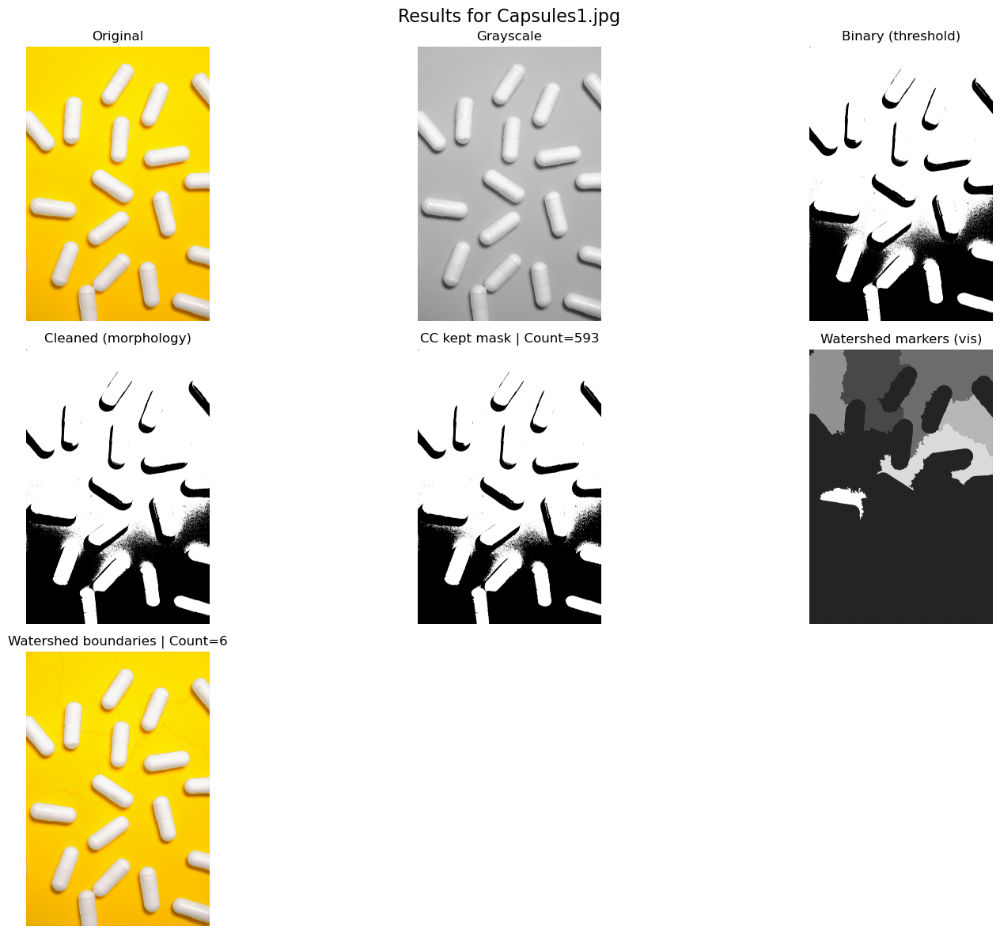

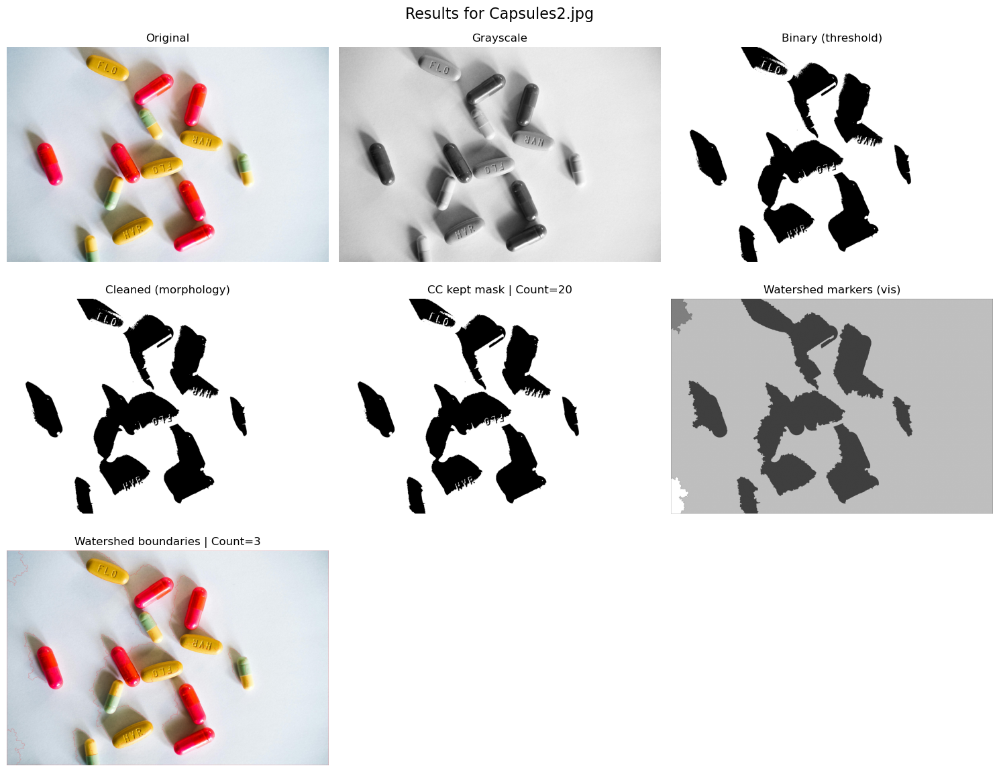

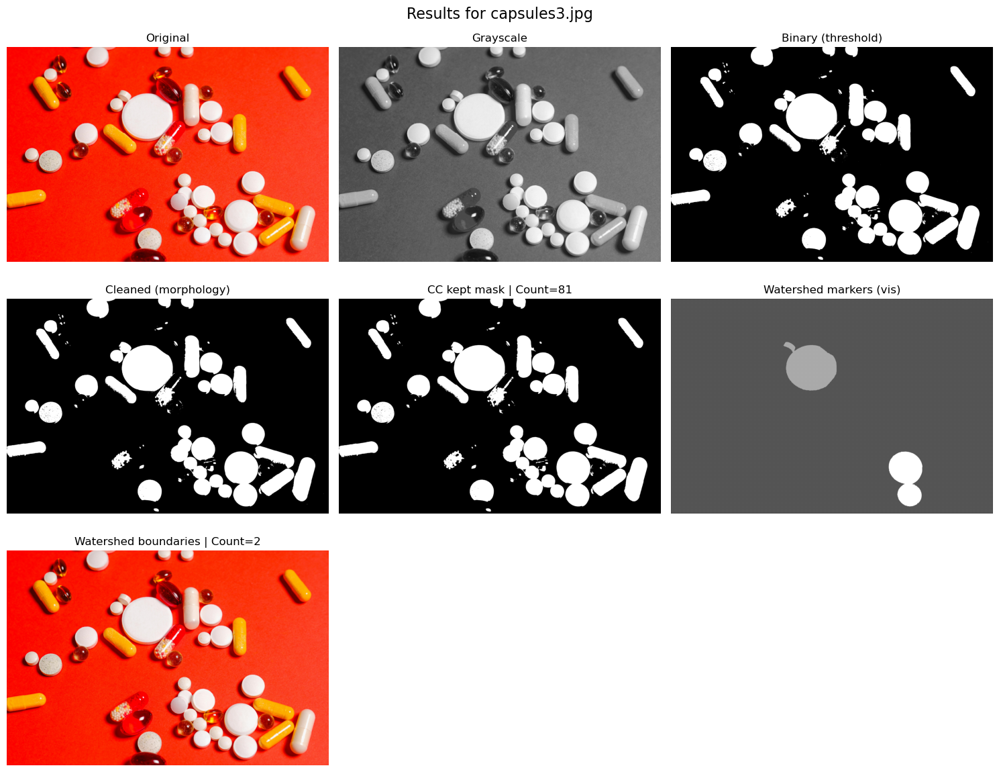

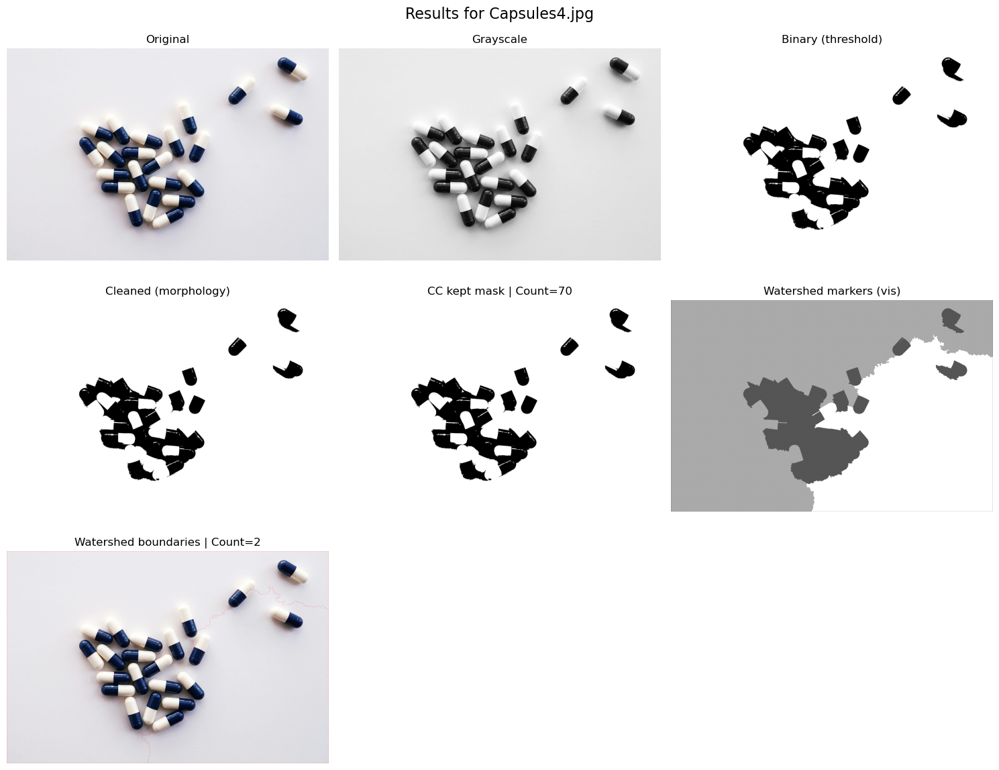

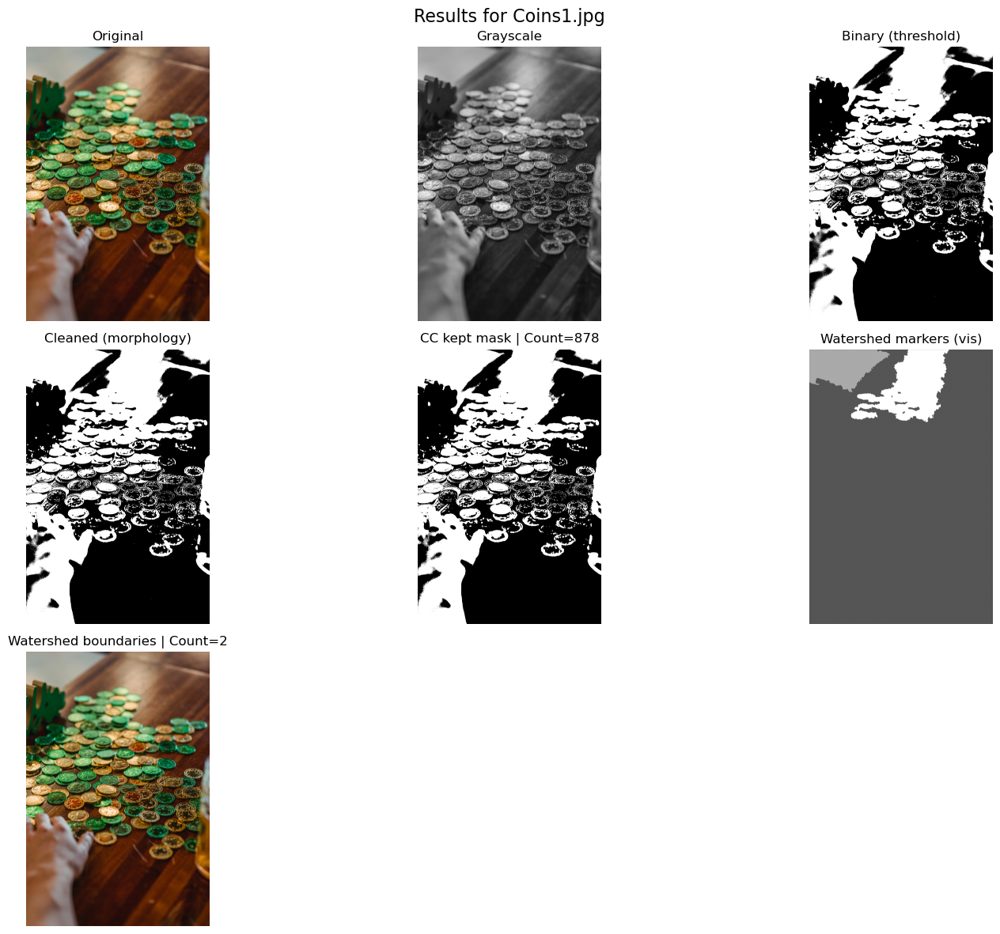

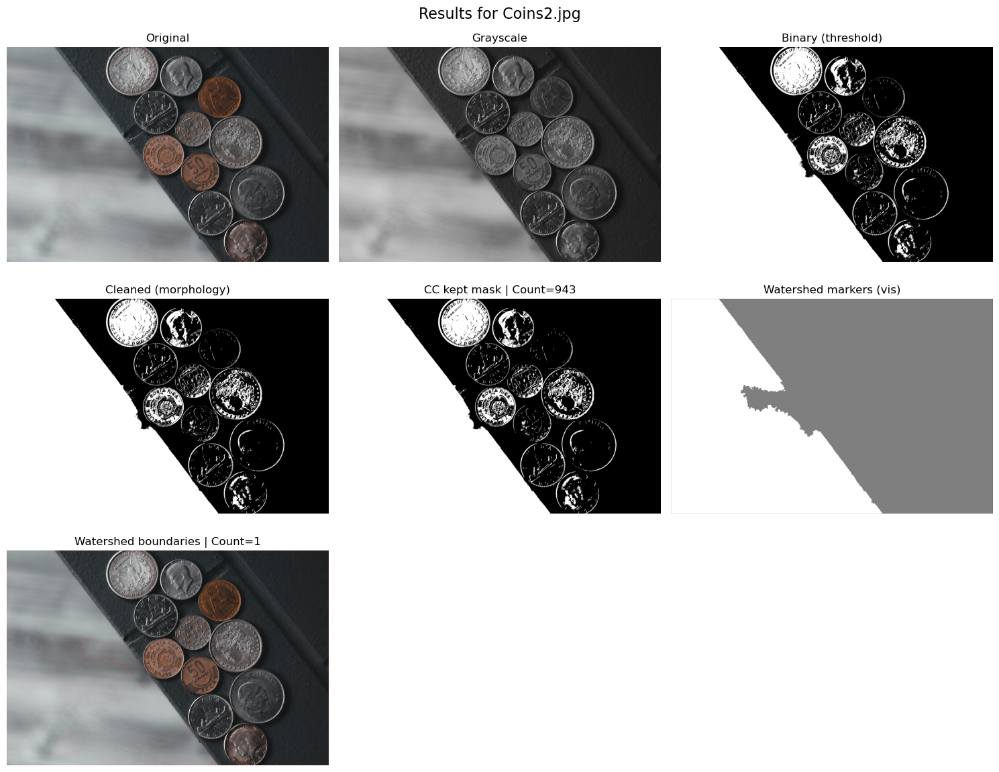

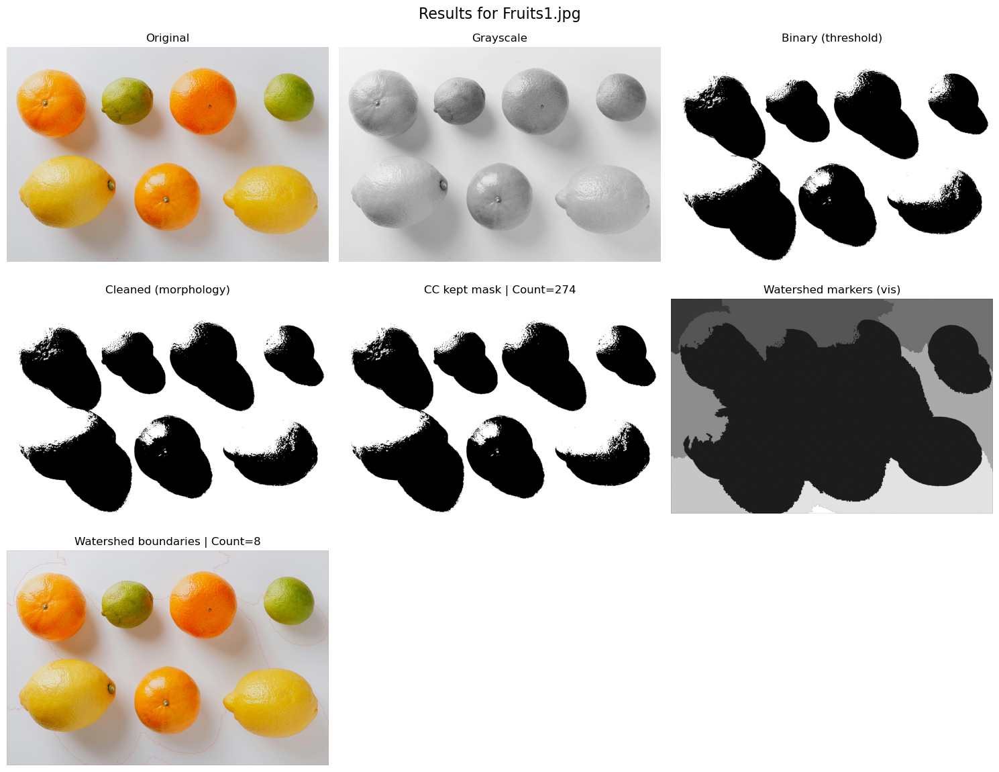

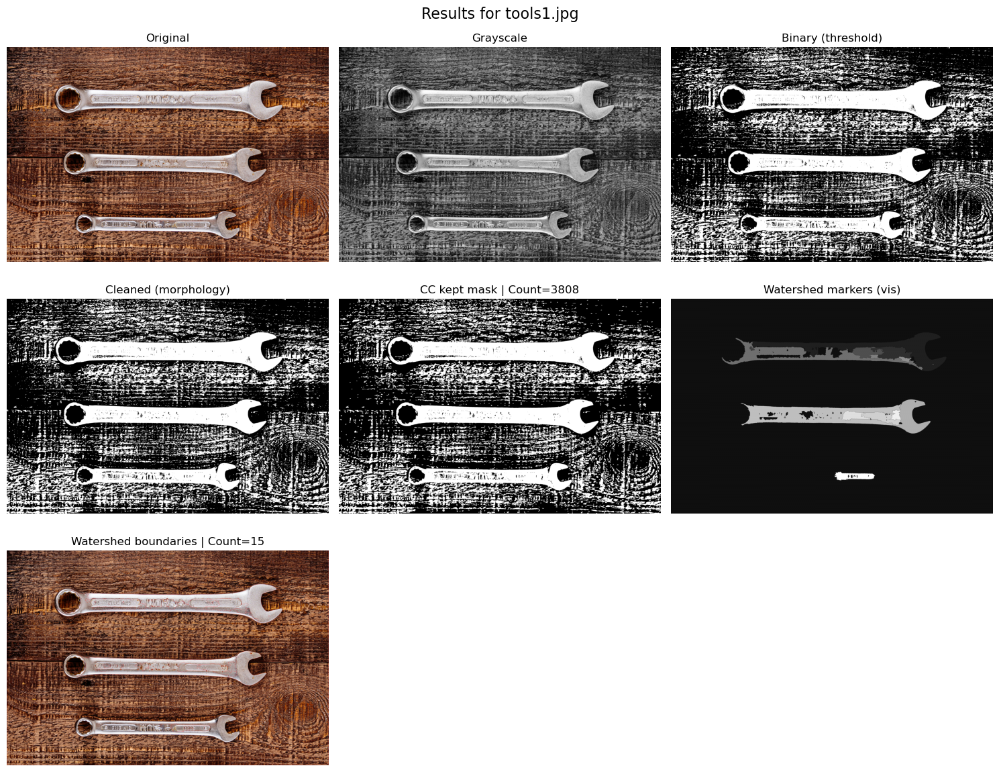

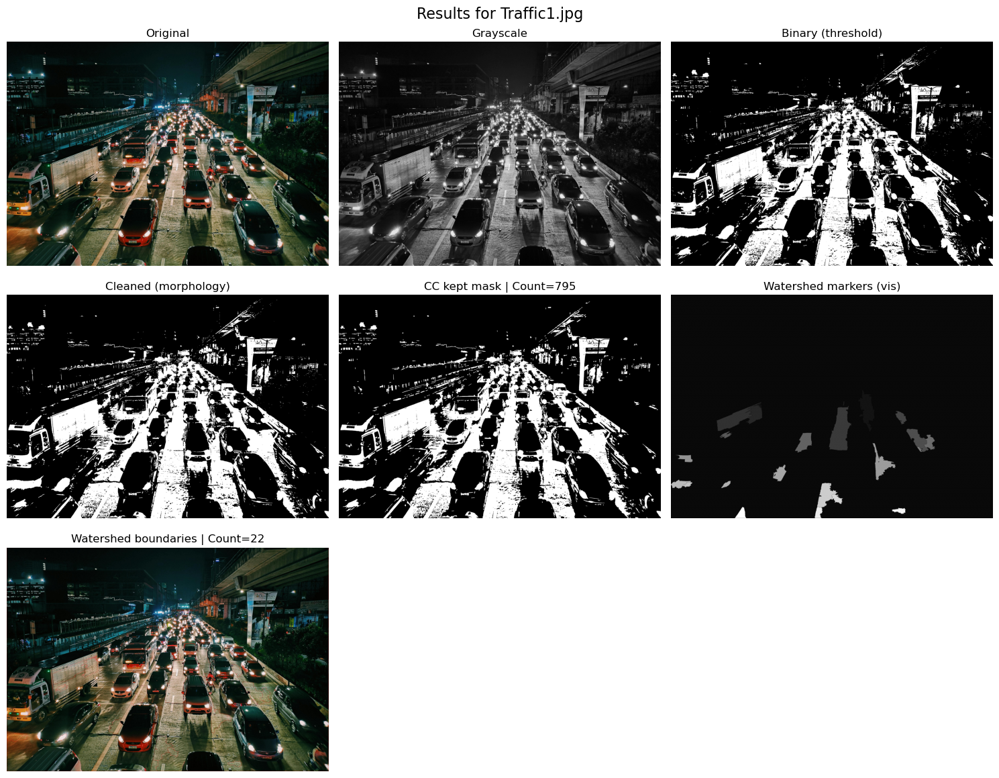

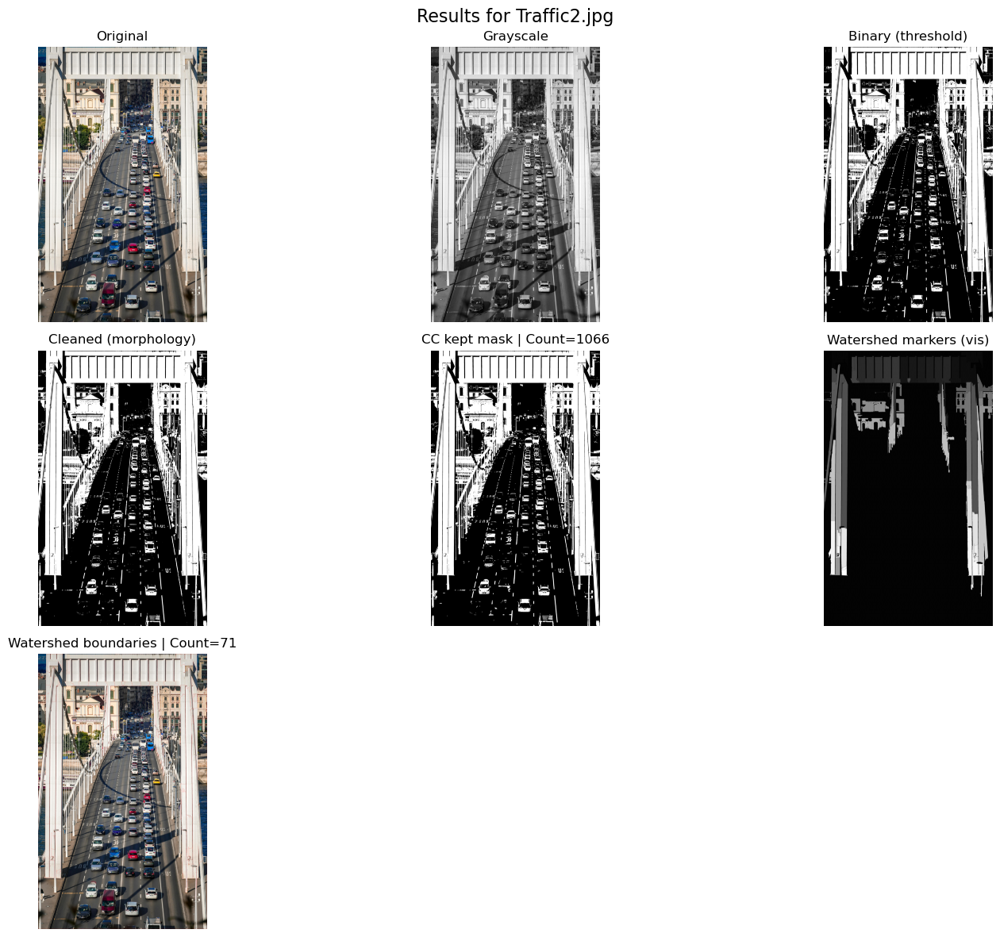

In [9]:
for res in results:
    imgs = [
        # original is BGR (will display as RGB in show_images)
        dict(img=image_data[[n for n, _ in image_data].index(res["name"])][1], title="Original"),
        dict(img=res["gray"], title="Grayscale"),
        dict(img=res["binary"], title="Binary (threshold)"),
        dict(img=res["cleaned"], title="Cleaned (morphology)"),
        dict(img=res["kept_mask"], title=f"CC kept mask | Count={res['cc_count']}"),
        dict(img=res["markers_vis"], title="Watershed markers (vis)"),
        dict(img=res["overlay"], title=f"Watershed boundaries | Count={res['ws_count']}"),
    ]

    show_images(
        [x["img"] for x in imgs],
        [x["title"] for x in imgs],
        cols=3,
        suptitle=f"Results for {res['name']}"
    )
